# Installation

In [1]:
!pip install -qU gcvit --no-deps
!pip install -q tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 34.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcvit 1.1.1 requires gradio, which is not installed.


## Imports

In [2]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds

tfds.disable_progress_bar()

import os
import sys
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## TPU/GPU detection

In [3]:
# try:  # detect TPUs
#     tpu = tf.distribute.cluster_resolver.TPUClusterResolver.connect()  # TPU detection
#     strategy = tf.distribute.TPUStrategy(tpu)
# except ValueError:  # detect GPUss
#     strategy = (
#         tf.distribute.get_strategy()
#     )  # default strategy that works on CPU and single GPU
# print("Number of Accelerators: ", strategy.num_replicas_in_sync)

strategy = tf.distribute.get_strategy()
print("Number of GPUs: ", strategy.num_replicas_in_sync)

Number of GPUs:  1


## Configuration

In [5]:
# Model
IMAGE_SIZE = [224, 224]

# TPU
# if tpu:
#     BATCH_SIZE = (
#         16 * strategy.num_replicas_in_sync
#     )  # a TPU has 8 cores so this will be 128
# else:
#     BATCH_SIZE = 32  # on Colab/GPU, a higher batch size may throw(OOM)

BATCH_SIZE = 32  # on Colab/GPU, a higher batch size may throw(OOM)

# Dataset
CLASSES = [
    "dandelion",
    "daisy",
    "tulips",
    "sunflowers",
    "roses",
]  # don't change the order

# Other constants
MEAN = tf.constant([0.485 * 255, 0.456 * 255, 0.406 * 255])  # imagenet mean
STD = tf.constant([0.229 * 255, 0.224 * 255, 0.225 * 255])  # imagenet std
AUTO = tf.data.AUTOTUNE

# Data Pipeline

In [6]:
def make_dataset(dataset: tf.data.Dataset, train: bool, image_size: int = IMAGE_SIZE):
    def preprocess(image, label):
        # for training, do augmentation
        if train:
            if tf.random.uniform(shape=[]) > 0.5:
                image = tf.image.flip_left_right(image)
        image = tf.image.resize(image, size=image_size, method="bicubic")
        image = (image - MEAN) / STD  # normalization
        return image, label

    if train:
        dataset = dataset.shuffle(BATCH_SIZE * 10)

    return dataset.map(preprocess, AUTO).batch(BATCH_SIZE, drop_remainder=True).prefetch(AUTO)

# Flower Dataset

In [7]:
train_dataset, val_dataset = tfds.load(
    "tf_flowers",
    split=["train[:90%]", "train[90%:]"],
    as_supervised=True,
    try_gcs=True,  # gcs_path is necessary for tpu,
)

num_train = tf.data.experimental.cardinality(train_dataset)
num_val = tf.data.experimental.cardinality(val_dataset)
print(f"Number of training examples: {num_train}")
print(f"Number of validation examples: {num_val}")


Number of training examples: 3303
Number of validation examples: 367


## Prepare dataset

In [8]:
train_dataset = make_dataset(train_dataset, True)
val_dataset = make_dataset(val_dataset, False)

## Visualize

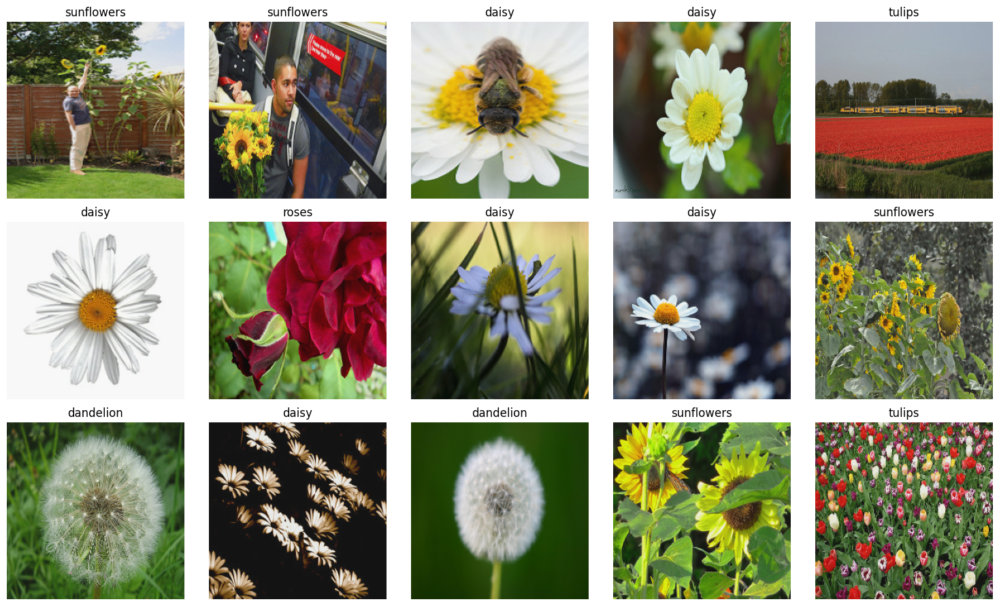

In [9]:
sample_images, sample_labels = next(iter(train_dataset))

plt.figure(figsize=(5 * 3, 3 * 3))
for n in range(15):
    ax = plt.subplot(3, 5, n + 1)
    image = (sample_images[n] * STD + MEAN).numpy()
    image = (image - image.min()) / (
        image.max() - image.min()
    )  # convert to [0, 1] for avoiding matplotlib warning
    plt.imshow(image)
    plt.title(CLASSES[sample_labels[n]])
    plt.axis("off")
plt.tight_layout()
plt.show()


# LR Scheduler Utility

In [10]:
# Reference:
# https://www.kaggle.com/ashusma/training-rfcx-tensorflow-tpu-effnet-b2


class WarmUpCosine(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(
        self, learning_rate_base, total_steps, warmup_learning_rate, warmup_steps
    ):
        super(WarmUpCosine, self).__init__()

        self.learning_rate_base = learning_rate_base
        self.total_steps = total_steps
        self.warmup_learning_rate = warmup_learning_rate
        self.warmup_steps = warmup_steps
        self.pi = tf.constant(np.pi)

    def __call__(self, step):
        if self.total_steps < self.warmup_steps:
            raise ValueError("Total_steps must be larger or equal to warmup_steps.")
        learning_rate = (
            0.5
            * self.learning_rate_base
            * (
                1
                + tf.cos(
                    self.pi
                    * (tf.cast(step, tf.float32) - self.warmup_steps)
                    / float(self.total_steps - self.warmup_steps)
                )
            )
        )

        if self.warmup_steps > 0:
            if self.learning_rate_base < self.warmup_learning_rate:
                raise ValueError(
                    "Learning_rate_base must be larger or equal to "
                    "warmup_learning_rate."
                )
            slope = (
                self.learning_rate_base - self.warmup_learning_rate
            ) / self.warmup_steps
            warmup_rate = slope * tf.cast(step, tf.float32) + self.warmup_learning_rate
            learning_rate = tf.where(
                step < self.warmup_steps, warmup_rate, learning_rate
            )
        return tf.where(
            step > self.total_steps, 0.0, learning_rate, name="learning_rate"
        )

# Training Hyperparameters

In [11]:
EPOCHS = 10
WARMUP_STEPS = 10
INIT_LR = 0.03
WAMRUP_LR = 0.006

TOTAL_STEPS = int((num_train / BATCH_SIZE) * EPOCHS)

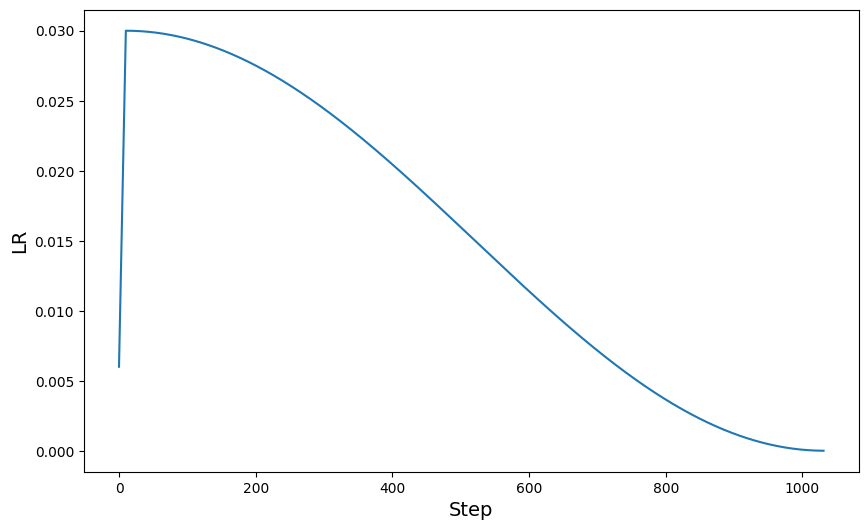

In [12]:
scheduled_lrs = WarmUpCosine(
    learning_rate_base=INIT_LR,
    total_steps=TOTAL_STEPS,
    warmup_learning_rate=WAMRUP_LR,
    warmup_steps=WARMUP_STEPS,
)

lrs = [scheduled_lrs(step) for step in range(TOTAL_STEPS)]
plt.figure(figsize=(10, 6))
plt.plot(lrs)
plt.xlabel("Step", fontsize=14)
plt.ylabel("LR", fontsize=14)
plt.show()


In [13]:
optimizer = keras.optimizers.SGD(scheduled_lrs)
loss = keras.losses.SparseCategoricalCrossentropy()

# Building GCViT

<h1 align="center">
<p><a href='https://arxiv.org/pdf/2206.09959v1.pdf'>GCViT: Global Context Vision Transformer</a></p>
</h1>
<div align=center><img src="https://raw.githubusercontent.com/awsaf49/gcvit-tf/main/image/lvg_arch.PNG" width=800></div>
<p align="center">
<img alt="python" src="https://img.shields.io/badge/python-%3E%3D3.6-blue?logo=python">
<img alt="tensorflow" src="https://img.shields.io/badge/tensorflow-%3E%3D2.4.1-orange?logo=tensorflow">
<div align=center><p>
</p></div>

In [32]:
from gcvit import GCViTTiny

# Khởi tạo strategy để tận dụng nhiều GPU
strategy = tf.distribute.MirroredStrategy()

# Tạo mô hình
with strategy.scope():
    model = GCViTTiny(input_shape=(*IMAGE_SIZE,3), pretrain=True)
    model.reset_classifier(num_classes=104, head_act='softmax')

# Compile mô hình
model.compile(
    optimizer= optimizer,
    loss= loss,
    metrics=['accuracy']
)

# Xem summary của mô hình
model.build_graph().summary()

Model: "gcvit_tiny"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 patch_embed (Stem)          (None, 56, 56, 64)        45632     
                                                                 
 pos_drop (Dropout)          (None, 56, 56, 64)        0         
                                                                 
 tf.cast_4 (TFOpLambda)      (None, 56, 56, 64)        0         
                                                                 
 levels/0 (GCViTLevel)       (None, 28, 28, 128)       223030    
                                                                 
 levels/1 (GCViTLevel)       (None, 14, 14, 256)       1004048   
                                                                 
 levels/2 (GCViTLevel)       (None, 7, 7, 512)         1

# Saving Checkpoint

In [33]:
ckpt_path = 'model.h5'
ckpt_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=ckpt_path,
    save_best_only=True,
    save_weights_only=True,
    monitor='val_sparse_categorical_accuracy',
    mode='max',
    verbose=1)

# Training & Validation

In [34]:
history = model.fit(train_dataset,
                    validation_data=val_dataset,
                    epochs=EPOCHS,
                    callbacks=[ckpt_callback])

Epoch 1/10
103/103 [==============================] - ETA: 0s - loss: 1.0872 - accuracy: 0.6751

103/103 [==============================] - 164s 999ms/step - loss: 1.0872 - accuracy: 0.6751 - val_loss: 0.2925 - val_accuracy: 0.9062
Epoch 2/10
103/103 [==============================] - ETA: 0s - loss: 0.2753 - accuracy: 0.9069

103/103 [==============================] - 96s 934ms/step - loss: 0.2753 - accuracy: 0.9069 - val_loss: 0.1750 - val_accuracy: 0.9318
Epoch 3/10
103/103 [==============================] - ETA: 0s - loss: 0.1799 - accuracy: 0.9393

103/103 [==============================] - 96s 933ms/step - loss: 0.1799 - accuracy: 0.9393 - val_loss: 0.1342 - val_accuracy: 0.9517
Epoch 4/10
103/103 [==============================] - ETA: 0s - loss: 0.1274 - accuracy: 0.9551

103/103 [==============================] - 96s 934ms/step - loss: 0.1274 - accuracy: 0.9551 - val_loss: 0.1282 - val_accuracy: 0.9545
Epoch 5/10
103/103 [==============================] - ETA: 0s - loss: 0.0916 - accuracy: 0.9712

103/103 [==============================] - 96s 933ms/step - loss: 0.0916 - accuracy: 0.9712 - val_loss: 0.1154 - val_accuracy: 0.9574
Epoch 6/10
103/103 [==============================] - ETA: 0s - loss: 0.0708 - accuracy: 0.9788

103/103 [==============================] - 96s 934ms/step - loss: 0.0708 - accuracy: 0.9788 - val_loss: 0.1222 - val_accuracy: 0.9574
Epoch 7/10
103/103 [==============================] - ETA: 0s - loss: 0.0575 - accuracy: 0.9842

103/103 [==============================] - 96s 934ms/step - loss: 0.0575 - accuracy: 0.9842 - val_loss: 0.1156 - val_accuracy: 0.9602
Epoch 8/10
103/103 [==============================] - ETA: 0s - loss: 0.0517 - accuracy: 0.9870

103/103 [==============================] - 96s 933ms/step - loss: 0.0517 - accuracy: 0.9870 - val_loss: 0.1091 - val_accuracy: 0.9574
Epoch 9/10
103/103 [==============================] - ETA: 0s - loss: 0.0485 - accuracy: 0.9876

103/103 [==============================] - 96s 932ms/step - loss: 0.0485 - accuracy: 0.9876 - val_loss: 0.1093 - val_accuracy: 0.9602
Epoch 10/10
103/103 [==============================] - ETA: 0s - loss: 0.0468 - accuracy: 0.9885

103/103 [==============================] - 96s 933ms/step - loss: 0.0468 - accuracy: 0.9885 - val_loss: 0.1101 - val_accuracy: 0.9631


## Training History

<Axes: xlabel='epoch', ylabel='score'>

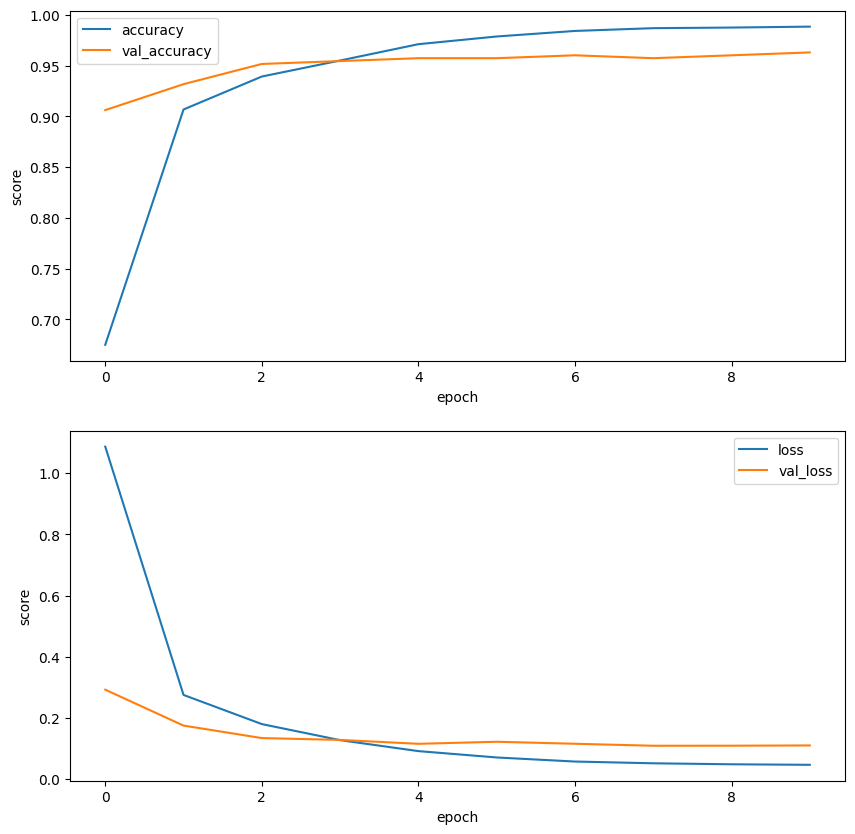

In [35]:
result = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))
result[["accuracy", "val_accuracy"]].plot(xlabel="epoch", ylabel="score", ax=ax[0])
result[["loss", "val_loss"]].plot(xlabel="epoch", ylabel="score", ax=ax[1])

# Predictions

In [ ]:
sample_images, sample_labels = next(iter(val_dataset))

predictions = model.predict(sample_images, batch_size=16).argmax(axis=-1)
evaluations = model.evaluate(sample_images, sample_labels, batch_size=16)

print("[val_loss, val_acc]", evaluations)

2/2 [==============================] - 10s 219ms/step - loss: 0.1600 - accuracy: 0.9375
[val_loss, val_acc] [0.1599951833486557, 0.9375]


## Visualize

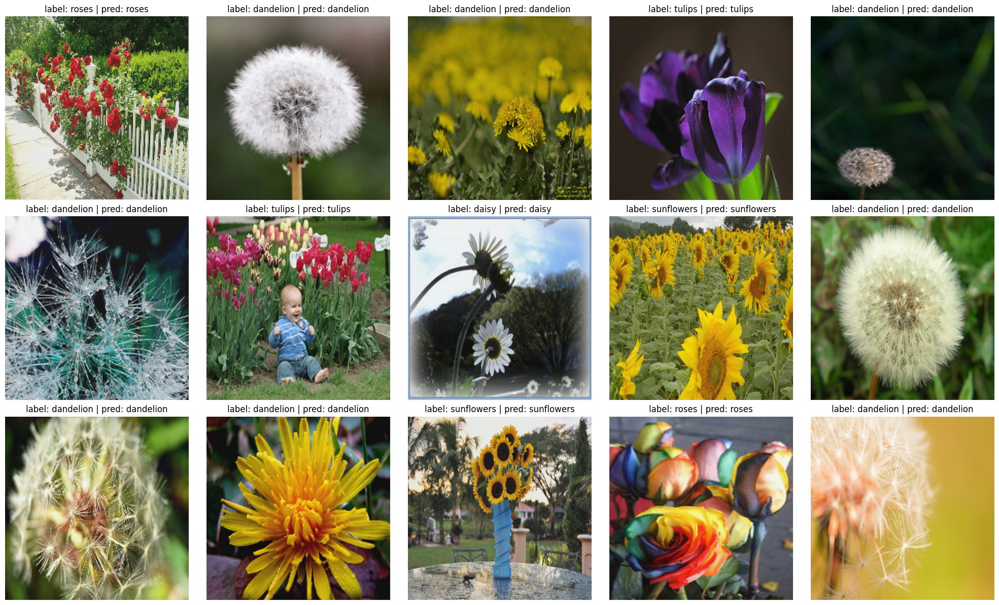

In [ ]:
plt.figure(figsize=(5 * 4, 3 * 4))
for i in range(15):
    ax = plt.subplot(3, 5, i + 1)
    image = (sample_images[i] * STD + MEAN).numpy()
    image = (image - image.min()) / (
        image.max() - image.min()
    )  # convert to [0, 1] for avoiding matplotlib warning
    plt.imshow(image)
    target = CLASSES[sample_labels[i]]
    pred = CLASSES[predictions[i]]
    plt.title("label: {} | pred: {}".format(target, pred), fontsize=12)
    plt.axis("off")
plt.tight_layout()
plt.show()


# Grad-CAM

In [ ]:
from gcvit.utils import get_gradcam_model, get_gradcam_prediction
from tqdm import tqdm

In [ ]:
gradcam_model = get_gradcam_model(model) # make gradcam model

In [ ]:
# Generate Grad-CAM heatmaps
heatmaps = []
for i in tqdm(range(15)):
  pred, heatmap = get_gradcam_prediction(sample_images[i].numpy(), gradcam_model, process=False, decode=False)
  heatmaps.append(heatmap)

100%|██████████| 15/15 [00:26<00:00,  1.80s/it]


## Visualize

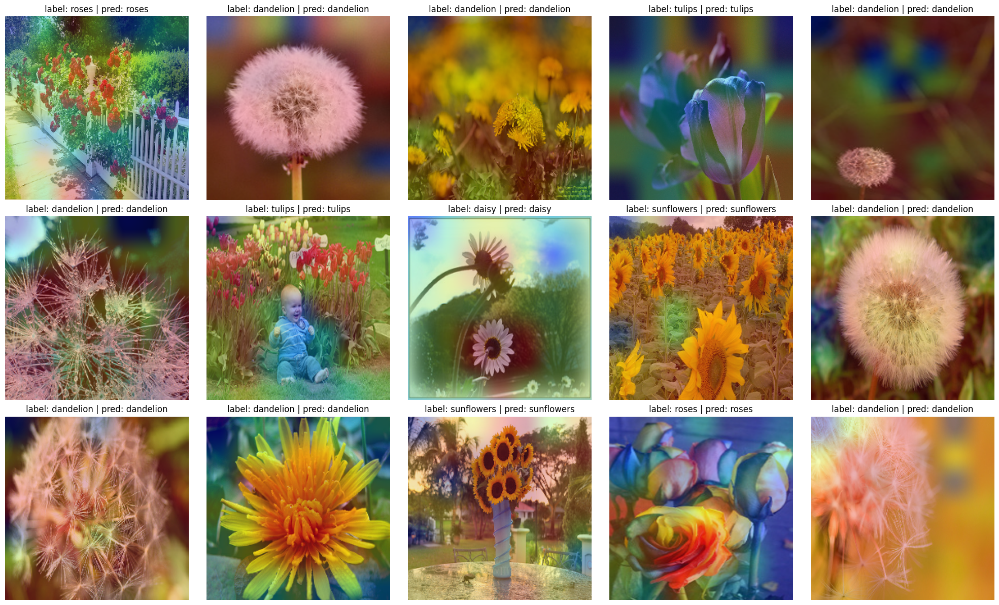

In [ ]:
plt.figure(figsize=(5 * 4, 3 * 4))
for i in range(15):
    ax = plt.subplot(3, 5, i + 1)
    plt.imshow(heatmaps[i])
    target = CLASSES[sample_labels[i]]
    pred = CLASSES[predictions[i]]
    plt.title("label: {} | pred: {}".format(target, pred), fontsize=12)
    plt.axis("off")
plt.tight_layout()
plt.show()

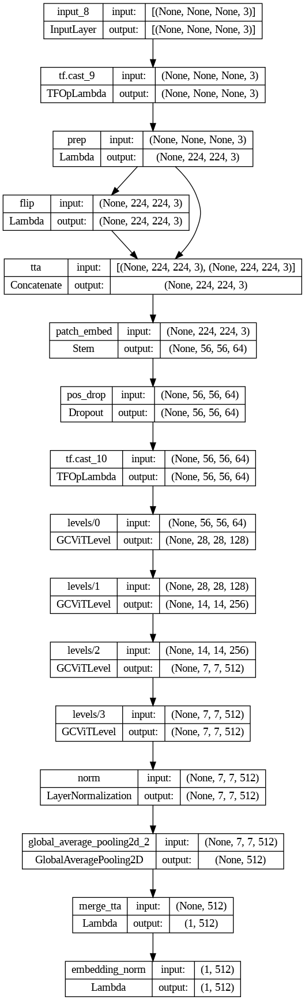

In [38]:
from gcvit import GCViTTiny

# Pre-process image
def preprocess_input(image):
    image = tf.image.resize(image, (224, 224), method='bicubic')
    image = tf.keras.applications.imagenet_utils.preprocess_input(image, mode='torch')
    return image

# Build backbone
backbone = GCViTTiny(input_shape=(224, 224, 3), pretrain=True)

# Build Model
inputs = tf.keras.layers.Input([None, None, 3], dtype=tf.uint8)
image = tf.cast(inputs, tf.float32) # type cast
image1 = tf.keras.layers.Lambda(lambda x: preprocess_input(x), name='prep')(image)
image2 = tf.keras.layers.Lambda(lambda x: tf.image.flip_left_right(x), name='flip')(image1) # by @orkatz2
image3 = tf.keras.layers.Concatenate(axis=0, name='tta')([image1, image2])
x = backbone.forward_features(image3)  # get 2d features: (None, 7, 7, 512)
x = tf.keras.layers.GlobalAveragePooling2D()(x)  # to 1d features (None, 512)
x = tf.keras.layers.Lambda(lambda x: tf.math.reduce_mean(x, axis=0, keepdims=True), name='merge_tta')(x)
x = tf.keras.layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=-1), name='embedding_norm')(x) # normalize
model = tf.keras.Model(inputs=[inputs], outputs=[x])
display(tf.keras.utils.plot_model(model, show_shapes=True))

# Save Model
CKPT_DIR = 'checkpoint'
model.save(CKPT_DIR)